# Labeling한 data 불러오기
---

### 직접 labeling (roboflow)
### class number : 3
- 0. scratch (긁힘 & 페인트 벗겨짐)
- 1. dent (찌그러짐)
- 2. crack (접합부위 벌어짐 & 깨짐)

### Img size : 416*416
### Augmentation 진행

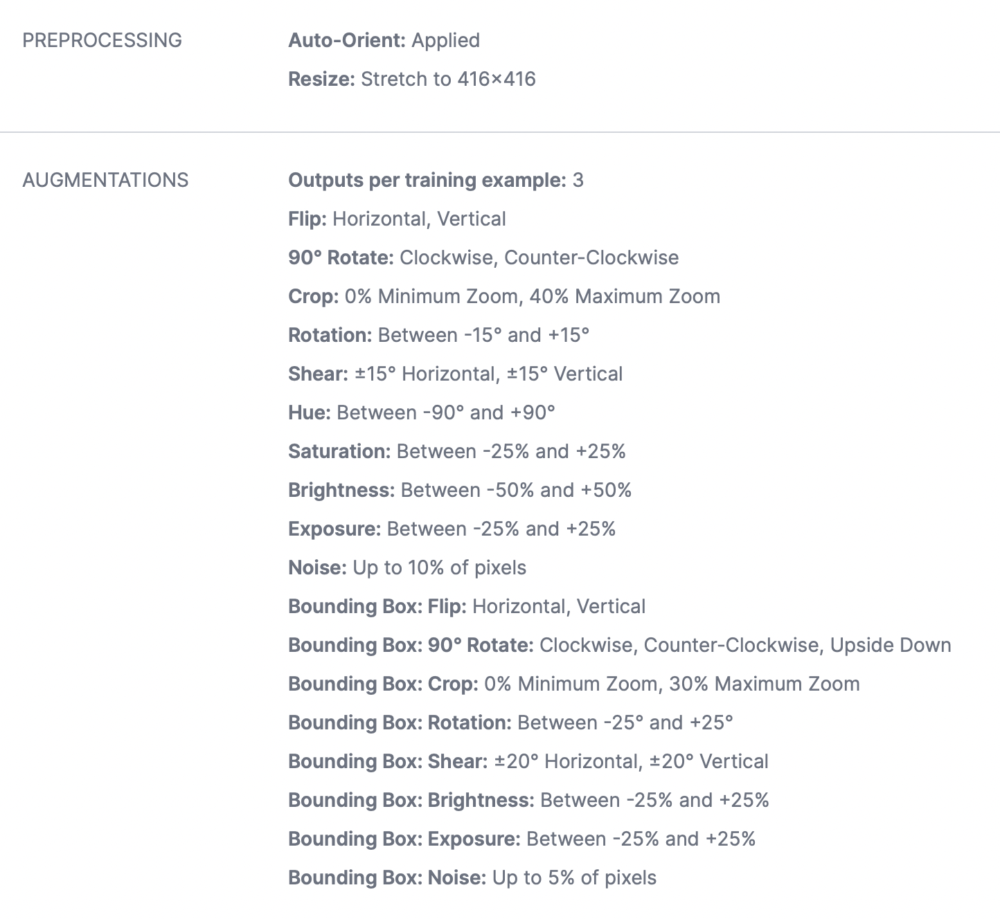

<br>

### Train Test 분리
- Train : 6296장
- Test : 150장

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!cp -rd /content/drive/MyDrive/Colab_Notebooks/Socar_class/scratch_small_bbox /content/car_damage

# YoloV5 설치

In [5]:
!cp -rd /content/drive/MyDrive/Colab_Notebooks/yolov5 /content/drive/MyDrive/Colab_Notebooks/Socar_class/git_

In [5]:
%cd /content/drive/MyDrive/Colab_Notebooks

/content/drive/MyDrive/Colab_Notebooks


In [6]:
!git clone https://github.com/ultralytics/yolov5.git

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [7]:
%cd /content/drive/MyDrive/Colab_Notebooks/yolov5
!pip install -r requirements.txt 

/content/drive/MyDrive/Colab_Notebooks/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 596 kB 7.3 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


# Train&Val data dir 설정

In [ ]:
# yaml파일에서 trian, val 경로를 수정해야함
%cat /content/car_damage/Socar_Hackathon/data.yaml

names: [crack, dent, scratch]
nc: 3
train: /content/drive/MyDrive/Colab_Notebooks/Socar_class/scratch_small_bbox/Socar_Hackathon/train.txt
val: /content/drive/MyDrive/Colab_Notebooks/Socar_class/scratch_small_bbox/Socar_Hackathon/val.txt


In [ ]:
import os

os.listdir(r'/content/car_damage/Socar_Hackathon/train')

['73_jpg.rf.4391aaeb4c452de806260df673df7358.txt',
 '47.rf.2dcfd389136962444058dd09424ed8b8.txt',
 '6.rf.b0f6d8663545cb17c1f43acae7c1d9f8.jpg',
 '20190413_10692_21851335_c67028ab80f62bdc7d1a7671e2745681.rf.e105bf1c733172d8d7ad8c0b8472d878.txt',
 '20190410_7658_21735705_a1ed01281e54a106143c72c78fd0436d.rf.7c89a72b5eeaa762dfb747da7b89cb9f.jpg',
 '75_jpg.rf.b49fcc6e0e05f4c655e4b15e5b6be3ad.txt',
 '29.rf.63e5a4bebeaceda1e05807114c22680f.txt',
 '20190520_12421_23638739_f74b219028c8773cd5907a81abfb65fa.rf.65c0d39f062b30cb64e21f568f3e2941.jpg',
 '20190228_13154_20426418_e8d298a13bb0bd098416084e0137bfe9_jpg.rf.bad524dac99fd72d1fc14a368589fc52.txt',
 '20190522_8295_23698148_1e54f17646ddc43824b3414e4a4f7dba.rf.52d7b86916605c4b8b48d67d86d6babb.txt',
 '17_jpg.rf.ff0cd0ab6ce8101555eb6fa660538fe3.jpg',
 '76.rf.73963eea6e433e2a1deed180cd74c90b.txt',
 '20190410_4735_21736525_23c2b0b4b60fcaf13882b41c99e4aad2_jpg.rf.e1d21dfd82baab248de058b6d4cc889b.txt',
 '15_jpg.rf.ea37cebad4db44a6c5dfe43c7db155cc.jpg'

In [ ]:
from glob import glob

img_list = glob('/content/car_damage/Socar_Hackathon/train/*.jpg')
len(img_list)

6292

In [ ]:
# Train --> train&val (8:2)
from sklearn.model_selection import train_test_split

train_img_list, val_img_list = train_test_split(img_list, test_size=0.3, random_state=26)

In [ ]:
# 각 이미지들의 경로를 저장해줌
with open('/content/car_damage/Socar_Hackathon/train.txt','w') as f:
  f.write('\n'.join(train_img_list)+'\n')

with open('/content/car_damage/Socar_Hackathon/val.txt','w') as f:
  f.write('\n'.join(val_img_list)+'\n')

In [ ]:
# yaml 파일의 데이터 경로 변경
import yaml

with open('/content/car_damage/Socar_Hackathon/data.yaml', 'r') as f:
  data = yaml.load(f,Loader = yaml.FullLoader)
  #data = yaml.load(f)

print(data)

# 경로 입력
data['train'] = '/content/car_damage/Socar_Hackathon/train.txt'
data['val'] = '/content/car_damage/Socar_Hackathon/val.txt'


with open('/content/car_damage/Socar_Hackathon/data.yaml','w') as f:
  yaml.dump(data,f)

print(data)

{'names': ['crack', 'dent', 'scratch'], 'nc': 3, 'train': '/content/drive/MyDrive/Colab_Notebooks/Socar_class/scratch_small_bbox/Socar_Hackathon/train.txt', 'val': '/content/drive/MyDrive/Colab_Notebooks/Socar_class/scratch_small_bbox/Socar_Hackathon/val.txt'}
{'names': ['crack', 'dent', 'scratch'], 'nc': 3, 'train': '/content/car_damage/Socar_Hackathon/train.txt', 'val': '/content/car_damage/Socar_Hackathon/val.txt'}


# YoloV5 학습
- yolov5s (small) 사용
- pretrained 모델 : yolov5s.pt
- 100 epoch / 16 batch size
- 저장 이름 : socar_hackathon_yolo5
<br>

### train log 의미
- box & obj & cls : 각 
- P(precision) : 모델이 예측한 결과의 positive가 얼마나 정확한지 (예측 중 옳게 예측한 비율)
- R(recall) : 모델이 예측한 결과가 positive를 얼마나 잘 찾는지 (실제 옳은 것 중 옳게 예측한 비율)
- mAP : 각각 pascalVOC, coco의 mAP 점수



In [ ]:
%cd /content/drive/MyDrive/Colab_Notebooks/yolov5

/content/drive/MyDrive/Colab_Notebooks/yolov5


In [ ]:
# yolov5s 학습 (100epoch)
!python train.py --img 416 --batch 64 --epochs 150 --data /content/car_damage/Socar_Hackathon/data.yaml --cfg ./models/yolov5m.yaml --weight yolov5m.pt --name socar_hackathon_yolov5m

train: weights=yolov5m.pt, cfg=./models/yolov5m.yaml, data=/content/car_damage/Socar_Hackathon/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=64, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=socar_hackathon_yolov5m, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
Command 'git fetch && git config --get remote.origin.url' timed out after 5 seconds
YOLOv5 🚀 v6.1-277-gfdc9d91 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=

# 결과 확인
- 50epoch 했을 때, 성능이 계속 향상됨 (loss가 계속 감소) ==> 100 epoch으로 증가 <br>
- socar_hackathon_yolov5로 저장
:: /content/drive/MyDrive/Colab_Notebooks/yolov5/runs/train/socar_hackathon_yolov5/weights/best.pt

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/MyDrive/Colab_Notebooks/yolov5/runs/train/socar_hackathon_yolov5m4

<IPython.core.display.Javascript object>

## Tensorboard 결과
- mAP, P, R 모두 학습이 진행될수록 증가하는 모습 <br>

- Train 뿐만 아니라 Validation data 에서도 loss가 계속 감소
- 나중에 심화시킨다면 epoch수를 더 증가시킬 수도 있을 것 같음

# Test


## Test data 불러오기


In [10]:
# Test data directory 설정
from PIL import Image
from glob import glob
import os

test_img_list = glob('/content/car_damage/Socar_Hackathon/test/*.jpg')

In [11]:
# 150개 test image
len(test_img_list)

150

## Model 적용
- 100epoch 학습 후 best model 불러오기 <br>

- confidence level : 0.3
- /content/drive/MyDrive/Colab_Notebooks/yolov5/runs/detect 에 저장

In [9]:
!python val.py --weight /content/drive/MyDrive/Colab_Notebooks/yolov5/runs/train/socar_hackathon_yolov5m4/weights/best.pt --img 416 --data /content/car_damage/Socar_Hackathon/data.yaml

val: data=/content/car_damage/Socar_Hackathon/data.yaml, weights=['/content/drive/MyDrive/Colab_Notebooks/yolov5/runs/train/socar_hackathon_yolov5m4/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-277-gfdc9d91 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5m summary: 290 layers, 20861016 parameters, 0 gradients, 47.9 GFLOPs
100% 755k/755k [00:00<00:00, 18.0MB/s]
val: Scanning '/content/drive/MyDrive/Colab_Notebooks/Socar_class/scratch_small_bbox/Socar_Hackathon/val.cache' images and labels... 622 found, 0 missing, 0 empty, 0 corrupt: 100% 622/622 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 20/20 [00:10<00:00,  1.97it/s]
          

In [12]:
# 150장의 test data에 대해 inference 진행
%cd /content/drive/MyDrive/Colab_Notebooks/yolov5

for test_img in test_img_list:
  !python detect.py --weight /content/drive/MyDrive/Colab_Notebooks/yolov5/runs/train/socar_hackathon_yolov5m4/weights/best.pt --img 416 --conf 0.6 --source "{test_img}" 

/content/drive/MyDrive/Colab_Notebooks/yolov5
detect: weights=['/content/drive/MyDrive/Colab_Notebooks/yolov5/runs/train/socar_hackathon_yolov5m4/weights/best.pt'], source=/content/car_damage/Socar_Hackathon/test/20190225_5951_20334254_0ed464f2c515929ac62986a1b5de3658.rf.6bd62971e7e6d25ab4803149be2163c5.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-277-gfdc9d91 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
YOLOv5m summary: 290 layers, 20861016 parameters, 0 gradients, 47.9 GFLOPs
image 1/1 /content/car_damage/Socar_Hackathon/test/20190225_5951_20334254_0ed464f2c515929ac62986a1b5de3658.rf.6bd629

## 이미지 시각화

In [13]:
from glob import glob

In [14]:
inf_test = glob('/content/drive/MyDrive/Colab_Notebooks/yolov5/runs/detect/*/*.jpg')

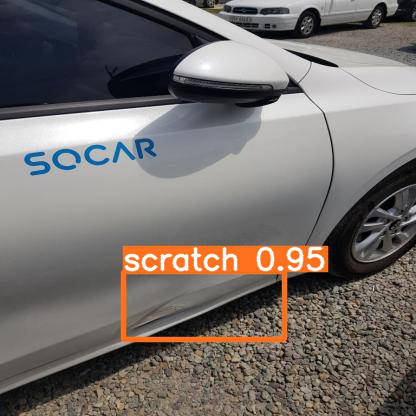

In [15]:
Image.open(inf_test[1], 'r')

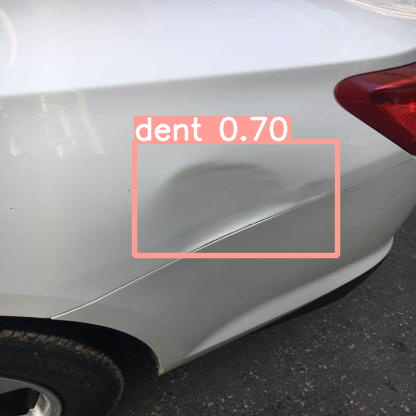

In [16]:
# 잘못된 bounding box : conf 수준 높여야될 필요 있을 듯
Image.open(inf_test[74], 'r')

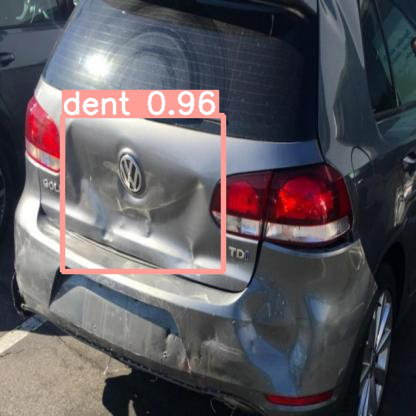

In [17]:
Image.open(inf_test[100], 'r')

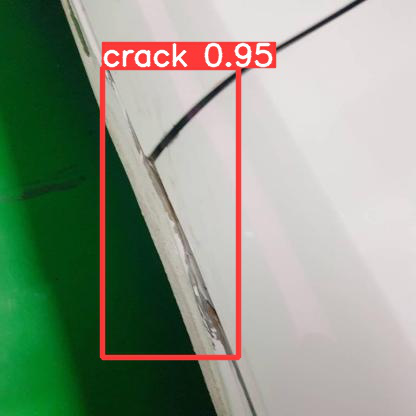

In [18]:
Image.open(inf_test[128], 'r')

## 전체 display

In [19]:
from IPython.display import Image, display

for imageName in inf_test:
    display(Image(filename=imageName))

Output hidden; open in https://colab.research.google.com to view.

## 비디오를 활용한 검출 task
---

In [20]:
test_videos_path = '/content/car_damage/Socar_Hackathon/test_videos'
test_videos = [os.path.join(test_videos_path,x) for x in os.listdir(test_videos_path)]
print(test_videos)

['/content/car_damage/Socar_Hackathon/test_videos/car_scratch_sample10.mp4', '/content/car_damage/Socar_Hackathon/test_videos/car_scratch_sample3.mp4', '/content/car_damage/Socar_Hackathon/test_videos/car_scratch_sample5.mp4', '/content/car_damage/Socar_Hackathon/test_videos/car_scratch_sample12.mp4', '/content/car_damage/Socar_Hackathon/test_videos/car_scratch_sample4.mp4', '/content/car_damage/Socar_Hackathon/test_videos/car_scratch_sample11.mp4', '/content/car_damage/Socar_Hackathon/test_videos/car_scratch_sample7.mp4', '/content/car_damage/Socar_Hackathon/test_videos/car_scratch_sample8.mp4', '/content/car_damage/Socar_Hackathon/test_videos/car_scratch_sample6.mp4', '/content/car_damage/Socar_Hackathon/test_videos/car_scratch_sample2.mp4', '/content/car_damage/Socar_Hackathon/test_videos/car_scratch_sample9.mp4']


In [21]:
%cd /content/drive/MyDrive/Colab_Notebooks/yolov5

for idx, test_video in enumerate(test_videos):
    print("Video : {}".format(idx))
    print("-------------------------------------")
    !python detect.py --weight /content/drive/MyDrive/Colab_Notebooks/yolov5/runs/train/socar_hackathon_yolov5m4/weights/best.pt --source "{test_video}" 
    print("")

/content/drive/MyDrive/Colab_Notebooks/yolov5
Video : 0
-------------------------------------
detect: weights=['/content/drive/MyDrive/Colab_Notebooks/yolov5/runs/train/socar_hackathon_yolov5m4/weights/best.pt'], source=/content/car_damage/Socar_Hackathon/test_videos/car_scratch_sample10.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-277-gfdc9d91 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
YOLOv5m summary: 290 layers, 20861016 parameters, 0 gradients, 47.9 GFLOPs
video 1/1 (1/120) /content/car_damage/Socar_Hackathon/test_videos/car_scratch_sample10.mp4: 384x640 Done. (0.015s)
video 1/1 (2/120

sample10 - scratch
sample3 - scratch
sample5 - dent
sample12 - dent, scratch
sample4 - dent, scratch
sample11 - crack, dent
sample7 - 
sample8 - scratch
sample6 - dent
sample2 - 
sample9 - 